# Image Augmentation

In [1]:
import torch
from torchvision import transforms
import torchvision.transforms.functional as F
import random
from PIL import Image
import matplotlib.pyplot as plt
import os

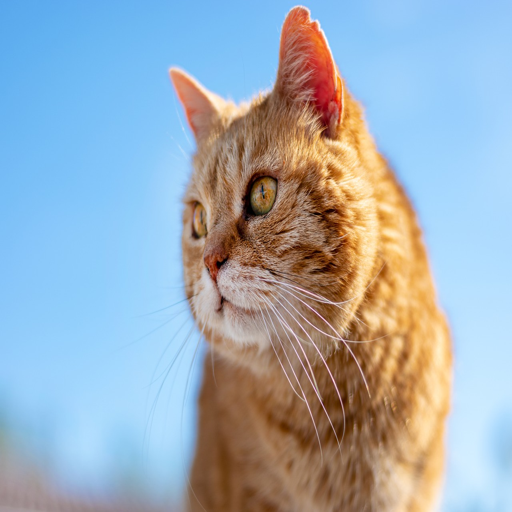

In [24]:
img_path = "./images/mycat.jpg"
image = Image.open(img_path).resize((512, 512))
image_tensor = F.to_tensor(image)   # (H x W x C) 범위: [0, 255] --> (C x H x W) 범위: [0.0, 1.0]

image

## Torchvision 라이브러리를 활용한 Augmentation

### Flip

- 좌우 반전: hflip/RandomHorizontalFlip(p)
- 상하 반전: vflip/RandomVerticalFlip(p)

확률 적용 여부에 따라 hflip/Random- 선택

- 특정 이미지를 확실히 뒤집을 때 -> hflip
- 데이터 증강이 목적일 대 -> Random-

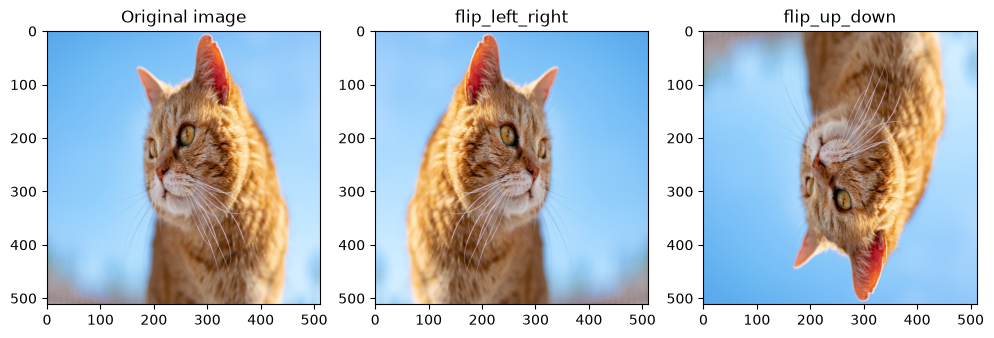

In [25]:
flip_lr_tensor = F.hflip(image_tensor)   # 좌우
flip_ud_tensor = F.vflip(image_tensor)   # 상하
flip_lr_image = F.to_pil_image(flip_lr_tensor)
flip_ud_image = F.to_pil_image(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

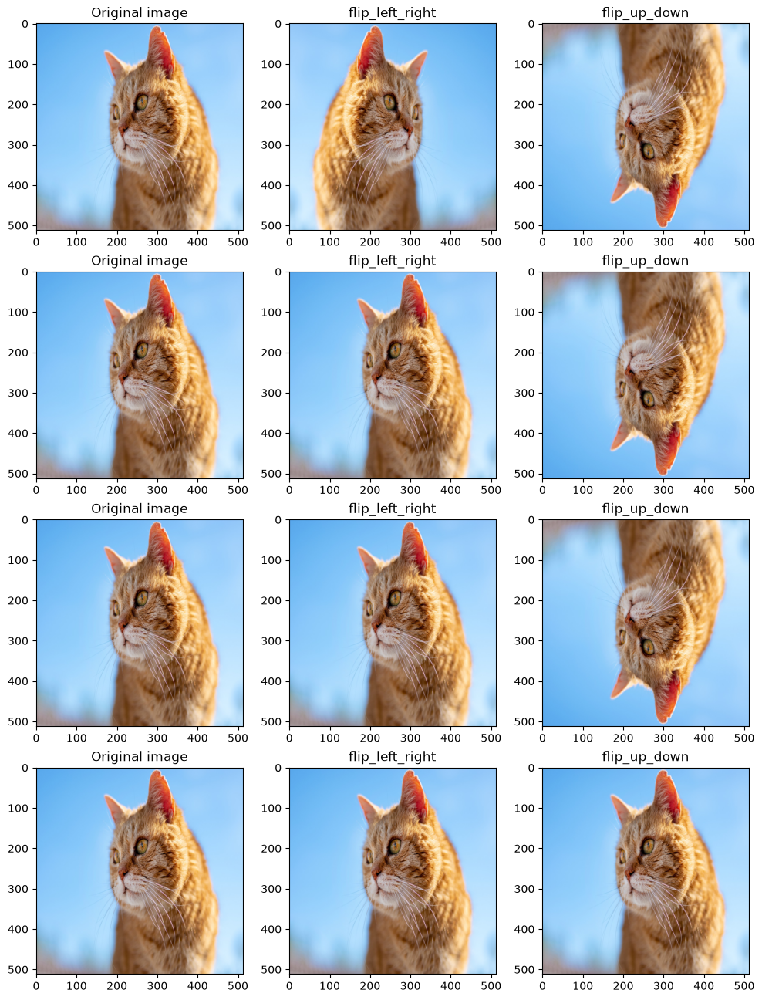

In [4]:
plt.figure(figsize=(12, 16))
# 0.5의 확률로 대칭 적용
random_flip_lr = transforms.RandomHorizontalFlip(p=0.5)
random_flip_ud = transforms.RandomVerticalFlip(p=0.5)

row = 4
for i in range(row):
    flip_lr_tensor = random_flip_lr(image_tensor)
    flip_ud_tensor = random_flip_ud(image_tensor)
    flip_lr_image = F.to_pil_image(flip_lr_tensor)
    flip_ud_image = F.to_pil_image(flip_ud_tensor)

    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

### Crop

- 이미지 일부를 자름
- RandomCrop: 무작위 자름
- Center Crop: 중앙을 기준으로 자름

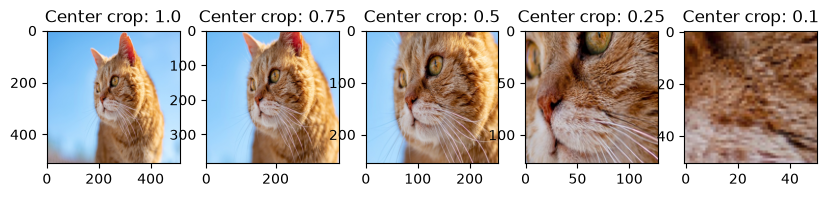

In [26]:
plt.figure(figsize=(12, 15))

# 중앙 크롭 비율: 1.0(원본) ~ 0.0(확대 범위 증가)
central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    crop_size = (int(image_tensor.shape[1] * frac), int(image_tensor.shape[2] * frac))
    cropped_tensor = F.center_crop(image_tensor, crop_size)
    cropped_img = F.to_pil_image(cropped_tensor)

    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

In [6]:
def random_central_crop(image_tensor, range=(0, 1)):
    """ range 범위에서 무작위로 잘라낼 비율을 선택 """
    central_fraction = torch.rand(1).item() * (range[1] - range[0]) + range[0]
    crop_size = (int(image_tensor.shape[1] * central_fraction), int(image_tensor.shape[2] * central_fraction))
    cropped_tensor = F.center_crop(image_tensor, crop_size)
    return cropped_tensor

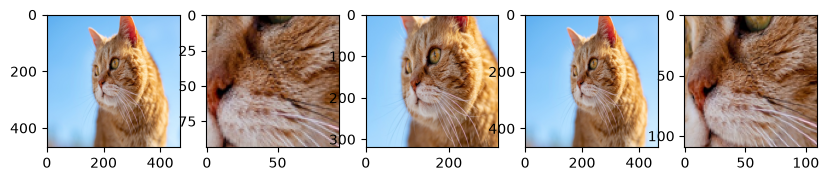

In [7]:
plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    cropped_tensor = random_central_crop(image_tensor)
    cropped_img = F.to_pil_image(cropped_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

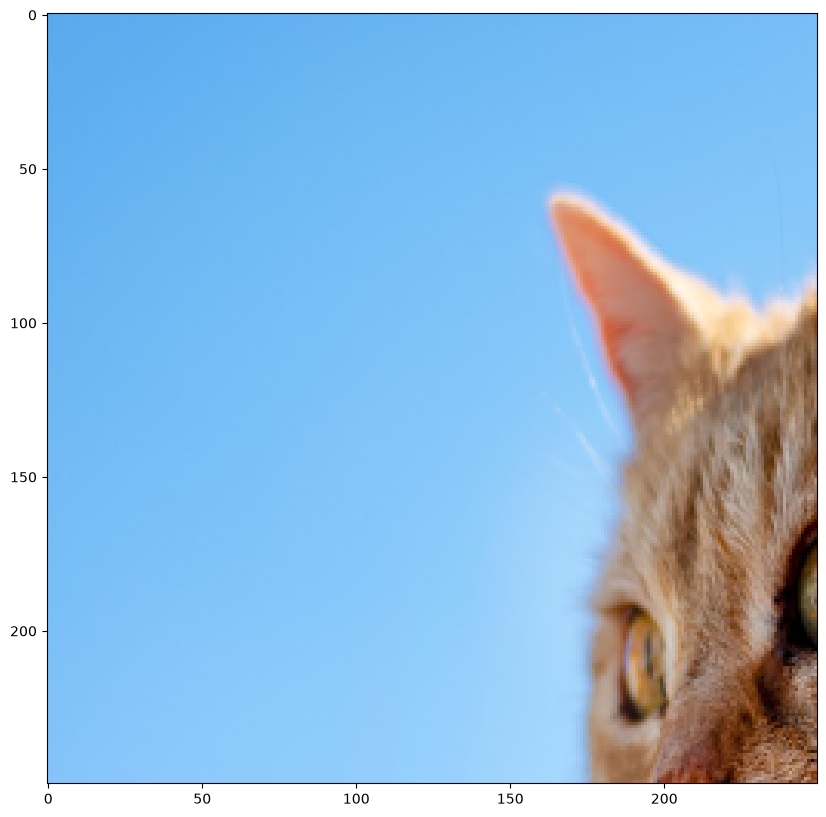

In [30]:
# Random Crop
plt.figure(figsize=(10, 10))
random_crop = transforms.RandomCrop(size=(250,250))   # 자른 크기

random_crop_tensor = random_crop(image_tensor)
random_crop_image = F.to_pil_image(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

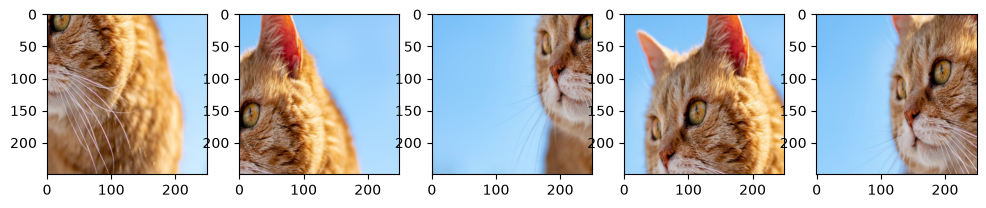

In [31]:
# 5개의 random crop 시각화
plt.figure(figsize=(12, 15))
random_crop = transforms.RandomCrop(size=(250,250))

for i in range(5):
  random_crop_tensor = random_crop(image_tensor)
  random_crop_image = F.to_pil_image(random_crop_tensor)
  plt.subplot(1, 5, i + 1)
  plt.imshow(random_crop_image)

### ColorJitter()

- brightness: 이미지 밝기 변경

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

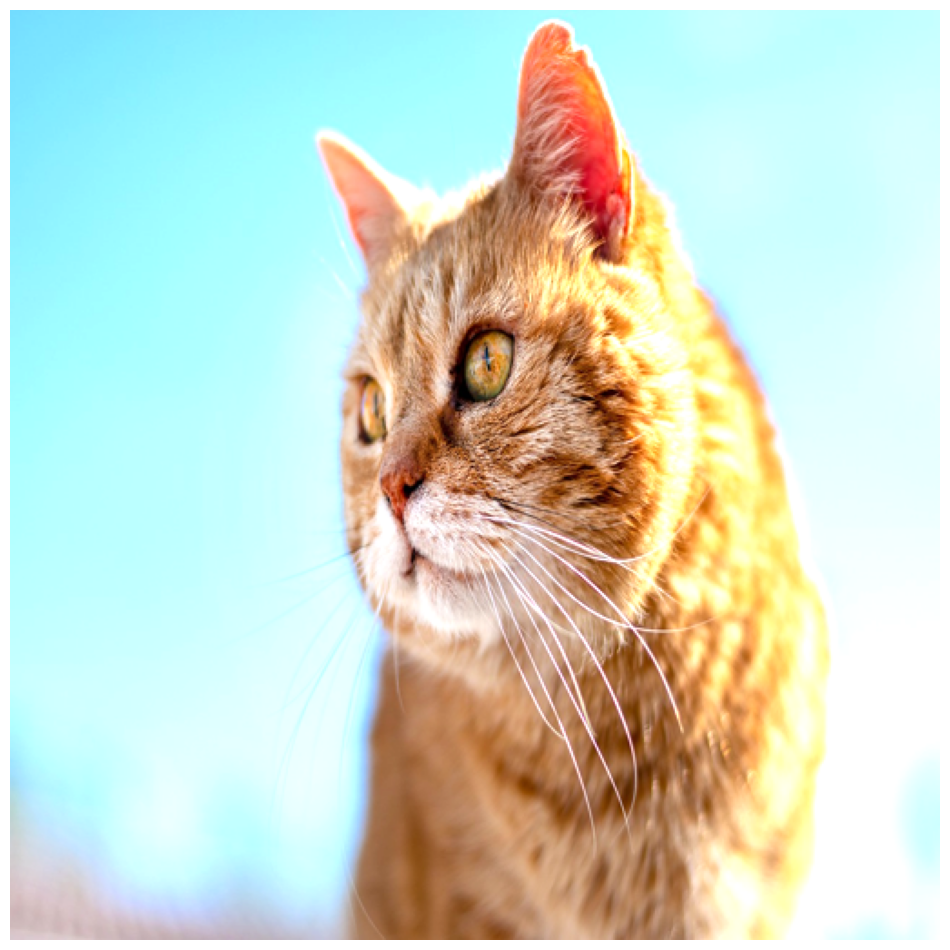

In [40]:
# 밝기 조절
plt.figure(figsize=(12, 15))
# [max(0, 1 - brightness), 1 + brightness] 범위에서 랜덤하게 선택
brightness_transform = transforms.ColorJitter(brightness=0.5)

random_bright_tensor = brightness_transform(image_tensor)
random_bright_image = F.to_pil_image(random_bright_tensor)

plt.imshow(random_bright_image)
plt.axis("off")
# plt.show()

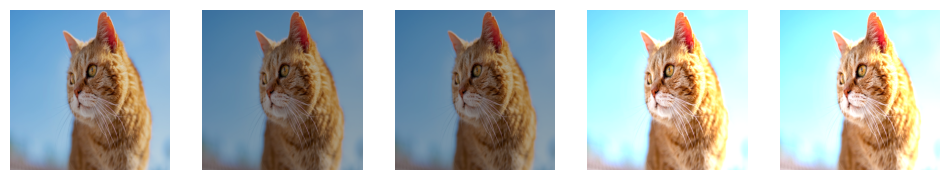

In [11]:
# random brightness을 적용한 5개 이미지 시각화
plt.figure(figsize=(12, 15))
brightness_transform = transforms.ColorJitter(brightness=0.5)

col = 5
for i in range(5):
    random_bright_tensor = brightness_transform(image_tensor)
    random_bright_image = F.to_pil_image(random_bright_tensor)

    plt.subplot(1,col,i+1)
    plt.imshow(random_bright_image)
    plt.axis("off")

## albumentations 라이브러리를 활용한 Augmentation

In [12]:
# !pip install -U albumentations

#### 라이브러리 설치 오류
```
ImportError: DLL load failed while importing stringzilla: 애플리케이션 제어 정책에서 이 파일을 차단했습니다.
```

- Window 제어 정책이 `stringzilla` 차단하는 오류 발생
- -> 예전 버전을 설치하여 해결

```
pip install "albumentations==1.4.18
```

In [13]:
import numpy as np

image = Image.open(img_path).resize((400, 300))
image_arr = np.array(image)   # 이미지를 배열로 처리
image_arr.shape

(300, 400, 3)

In [14]:
# 이미지 시각화 함수
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

### transforms.Affine()

- 기하학적 변환(확대, 위치 변경, 회전 등)을 통해 이미지 형태 변경
- 2x2 행렬을 사용하며 행렬 곱셈에 벡터 합을 활용해 표현
- 객체의 위치·각도·크기가 달라져도 같은 객체로 인식하도록 학습시키기 위함

```python
Affine(
    rotate(회전): 이미지를 일정 각도로 돌림
    scale(확대/축소): 이미지 크기 변환
    translation(이동)
    shear(기울임)
)
```

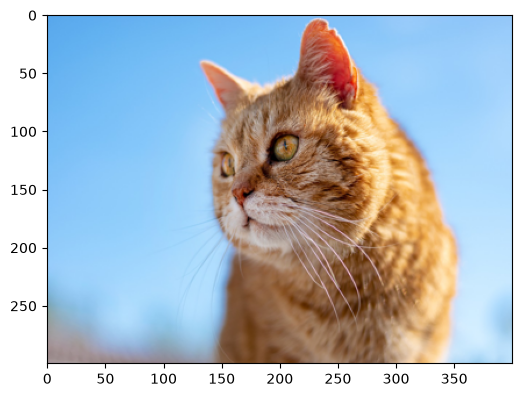

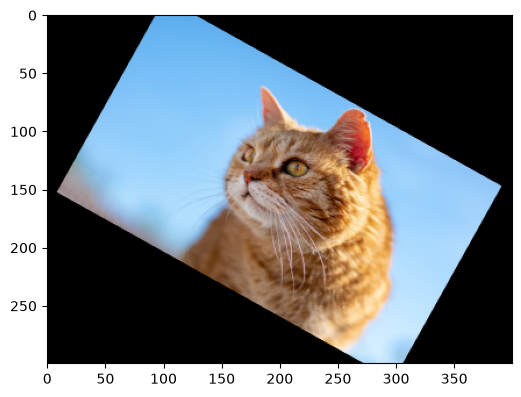

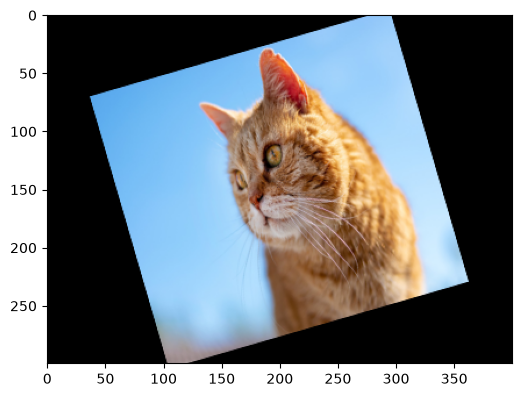

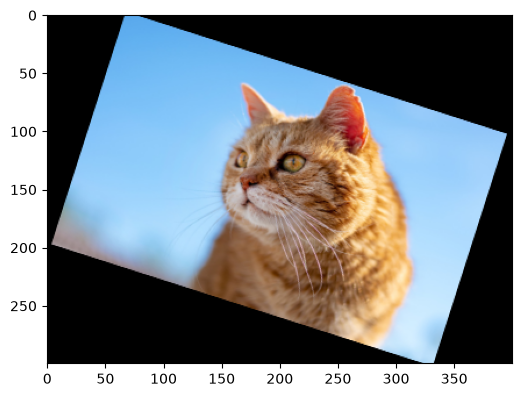

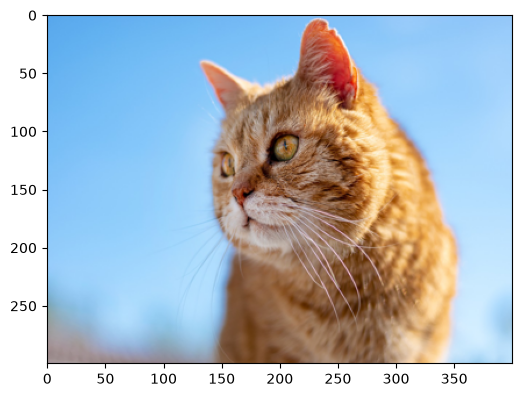

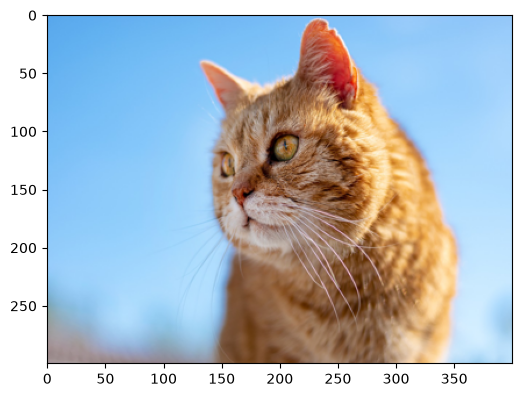

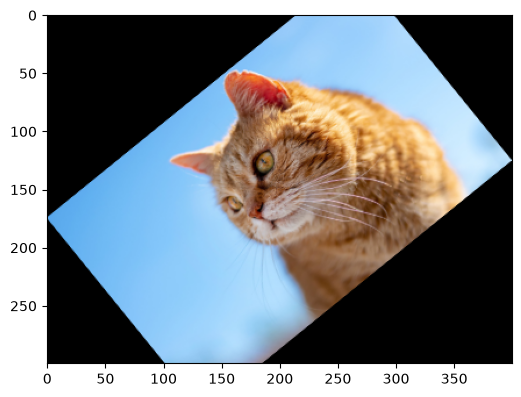

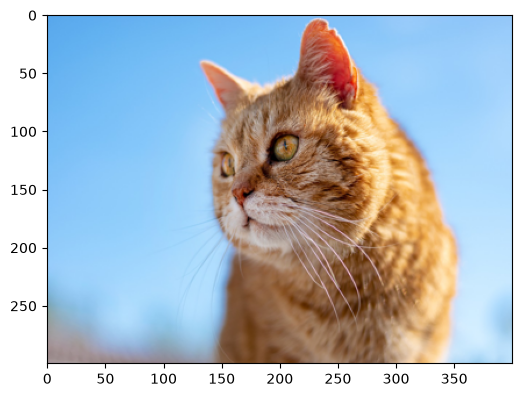

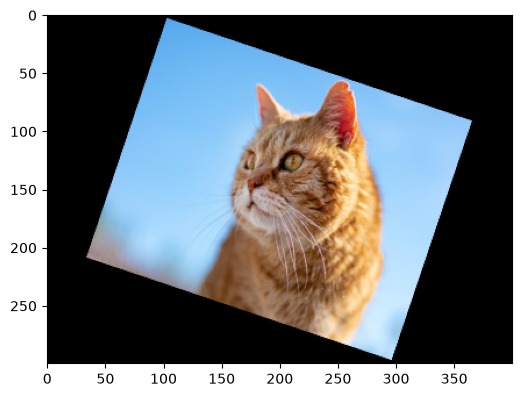

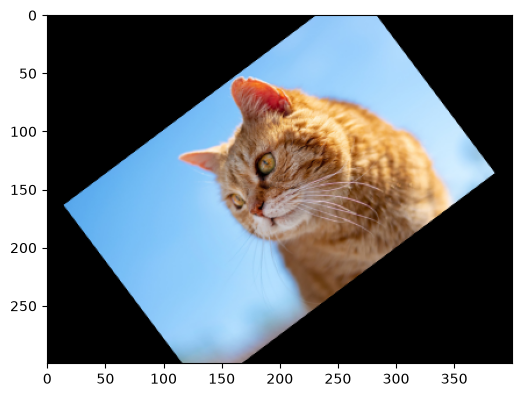

In [18]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(6, 6))
    plt.imshow((transformed['image']))
    plt.show()

### transforms.RandomCrop()

- 이미지의 일부 영역을 무작위 위치에서 잘라내는 기법
- 객체가 화면 전체에 담기지 않아도 인식하고, 배경의 일부만 봐도 판단할 수 있도록 함

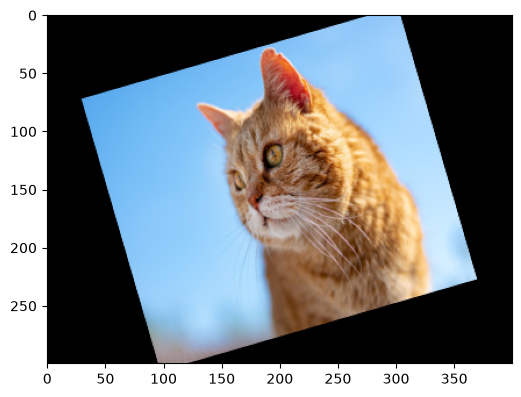

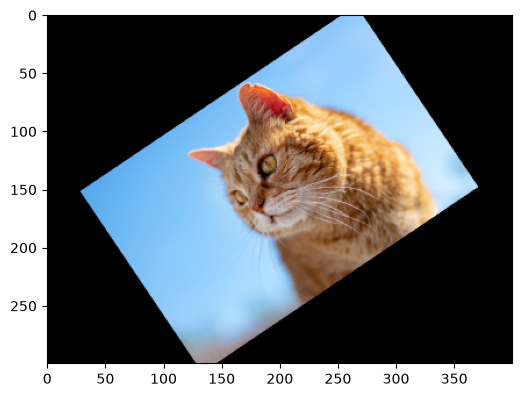

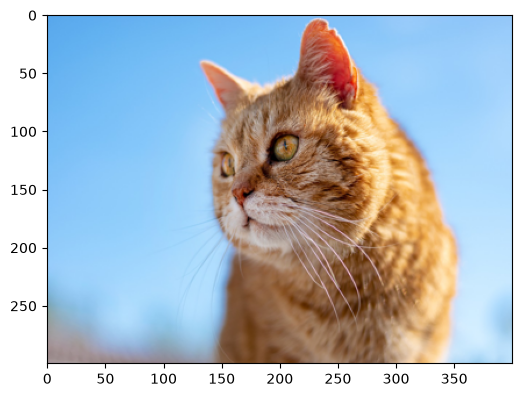

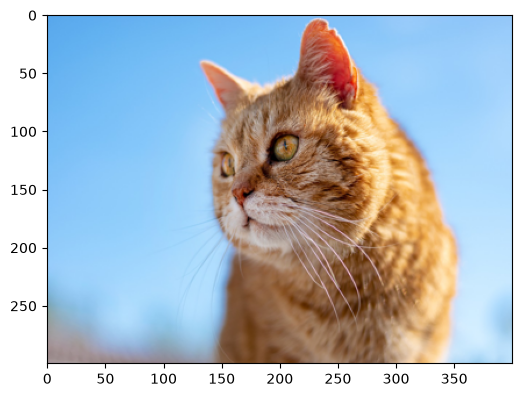

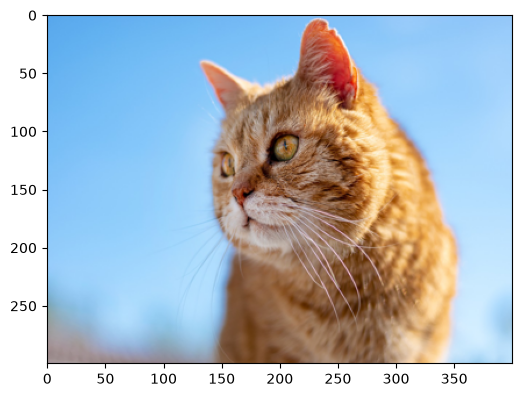

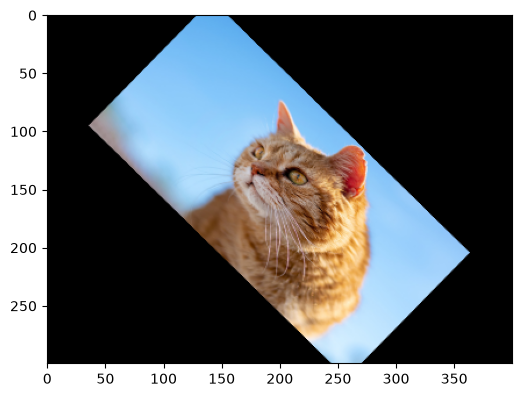

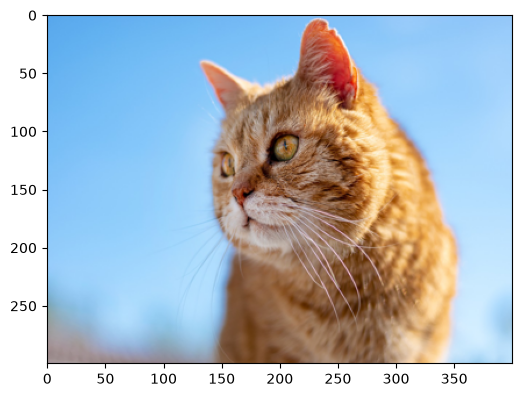

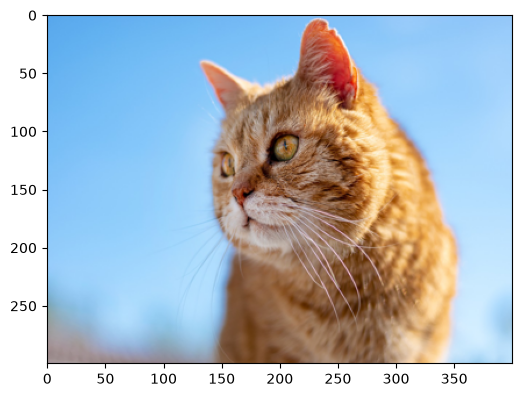

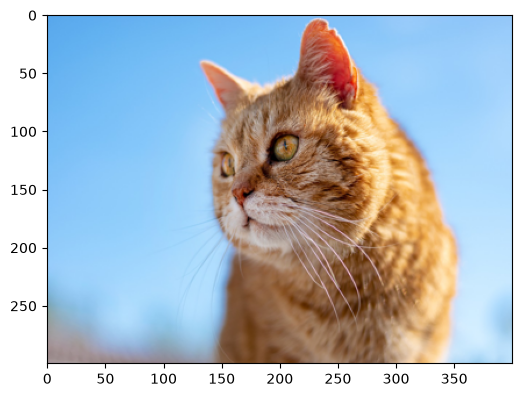

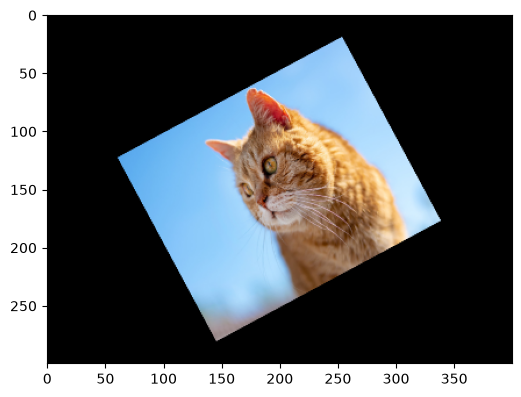

In [17]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(6, 6))
    plt.imshow((transformed['image']))
    plt.show()

### MedianBlur()

- 각 픽셀을 주변 픽셀들의 중간값으로 대체하여 이미지에 블러 처리를 주는 기법
- salt-and-pepper 노이즈를 제거하면서 객체의 경계는 비교적 잘 보존

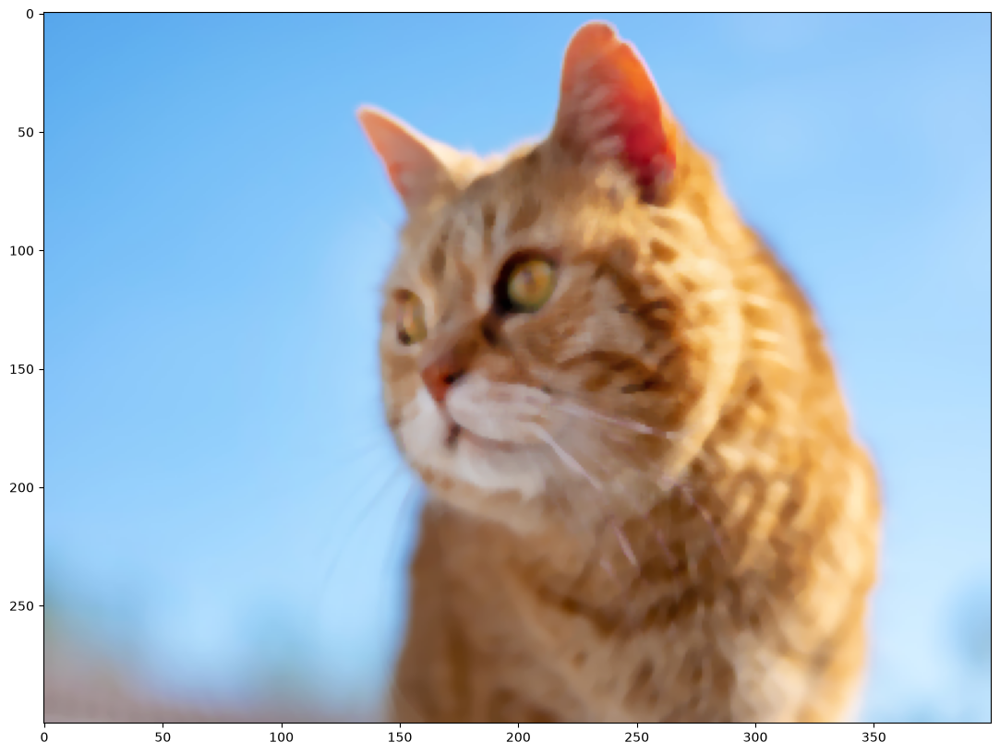

In [21]:
transform = A.Compose(
    [A.MedianBlur(blur_limit=7, p=1.0)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

### ToGray(),MultiplicativeNoise()

1. ToGray()

    - 컬러 이미지를 회색조로 바꾸는 기법
    - 색상에만 의존하지 않고 형태·질감으로 판단하도록 유도
2. MultiplicativeNoise()

   - 각 픽셀 값에 무작위 계수를 곱해 노이즈를 추가하는 기법
   - 현실의 지저분한 이미지를 흉내 내어 모델의 강건성 높임


```
MultiplicativeNoise(
    multiplier: 곱할 계수를 뽑는 범위. <1이면 어두워지고 >1이면 밝아짐
    elementwise: True -> 픽셀마다 다른 계수를 곱함, False -> 이미지 전체에 하나의 계수를 곱함
    per_channel: True -> 채널마다 다른 계수를 곱함(얼룩덜룩), False -> 채널마다 같은 계수 적용
)
```

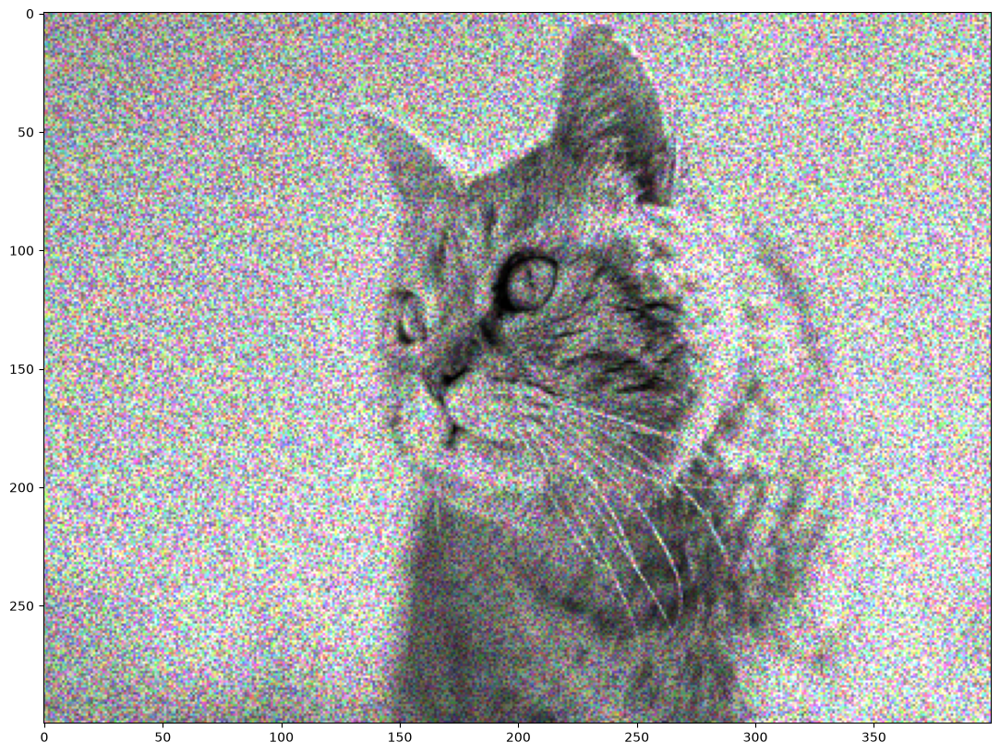

In [22]:
transform = A.Compose(
    [
        A.ToGray(p=1),
        A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)
    ]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

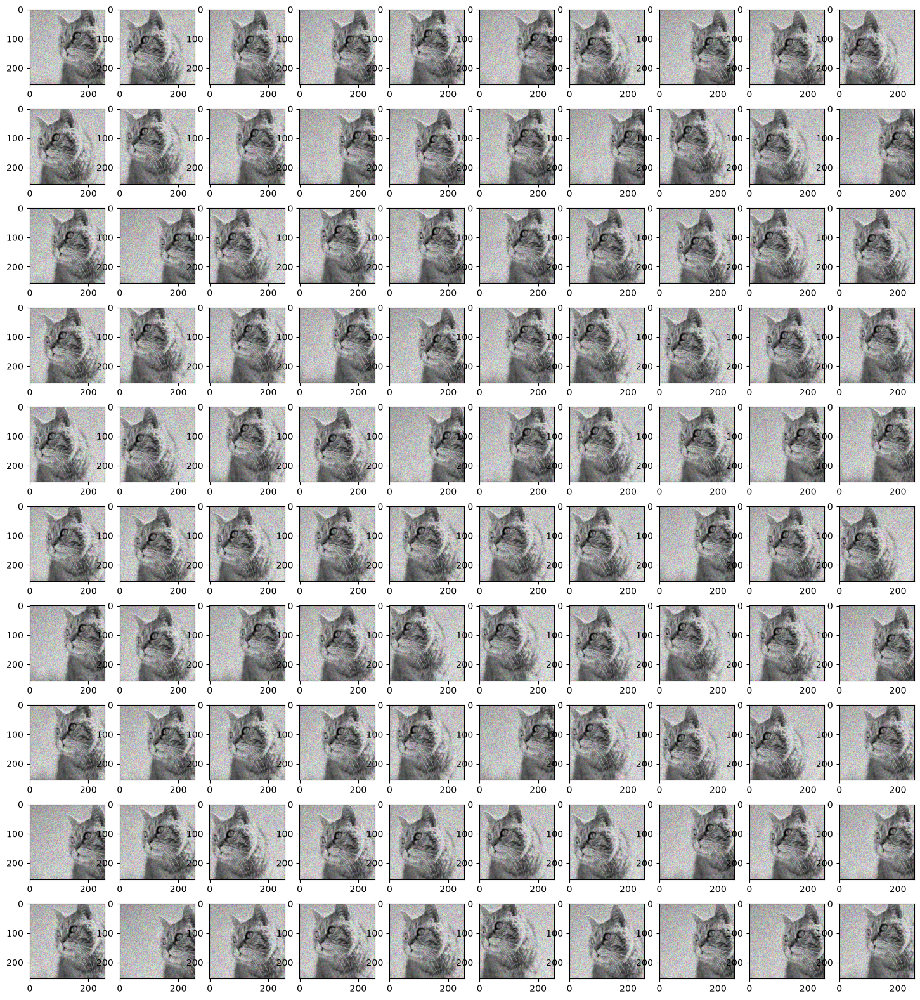

In [23]:
# Use various techniques and functions in albumentations library. show 100 images.

def transform_data(img_arr):
    transform = A.Compose(
        [
         A.ToGray(p=1),   # gray 생상
         A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1),   # 노이즈 추가
         A.RandomCrop(width=256, height=256, p=1)   # 랜덤 자르기
        ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)